In [1]:
from Binaries import *

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 3, 120, 1)]  0           []                               
                                                                                                  
 lambda (Lambda)                [(None, 120, 1),     0           ['input_1[0][0]']                
                                 (None, 120, 1),                                                  
                                 (None, 120, 1)]                                                  
                                                                                                  
 lstm (LSTM)                    (None, 1)            12          ['lambda[0][0]']                 
                                                                                              

/cr/users/filip/Binaries/Classifier.py:938: RuntimeWarning: invalid value encountered in sqrt
  eff_err = 1/(n_hit + n_miss)**2 * np.sqrt( n_hit**3 + n_miss**3 - 2 * np.sqrt((n_hit * n_miss)**3) )


/cr/users/filip/Binaries/Classifier.py:666: RuntimeWarning: invalid value encountered in sqrt
  eff_err = 1/(n_hit + n_miss)**2 * np.sqrt( n_hit**3 + n_miss**3 - 2 * np.sqrt((n_hit * n_miss)**3) )


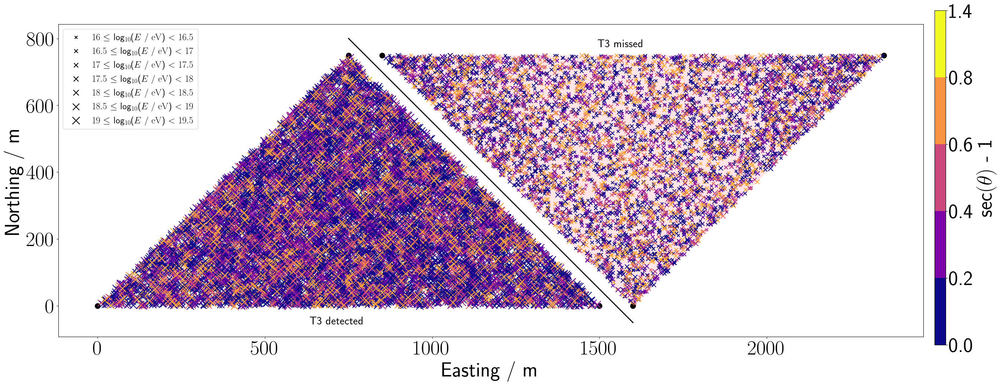

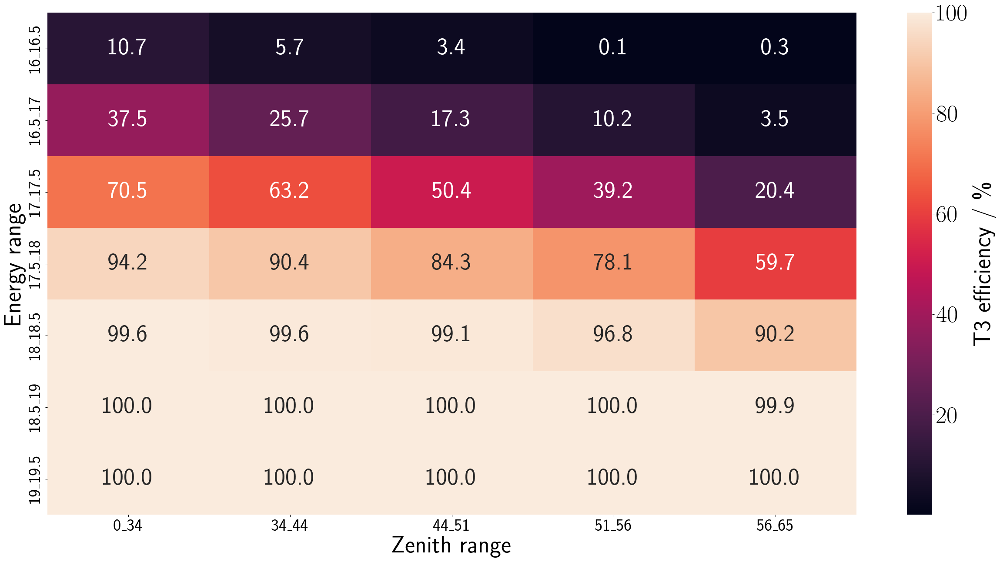

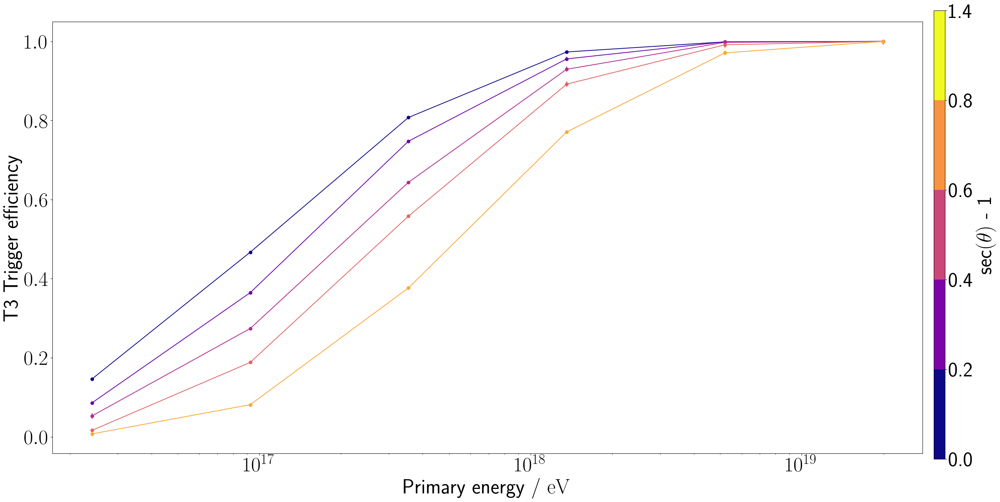

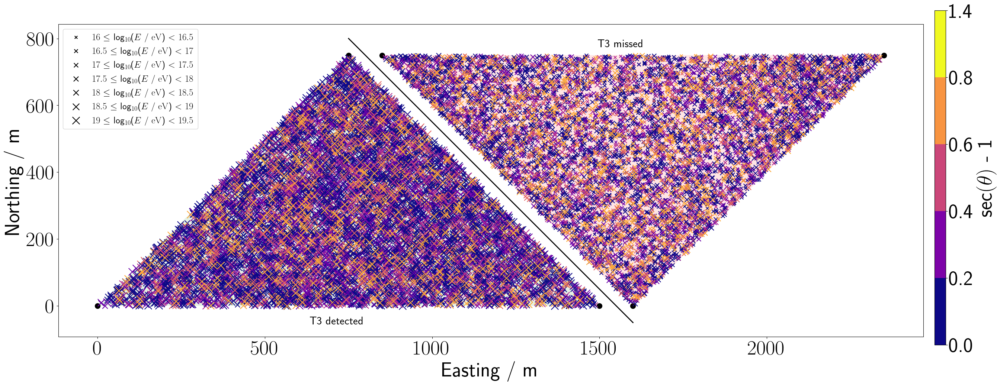

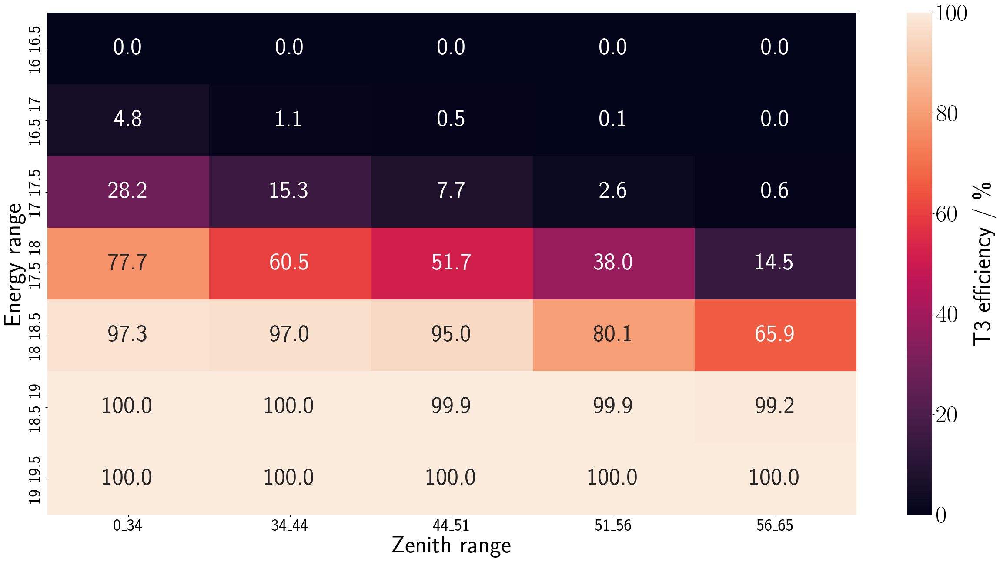

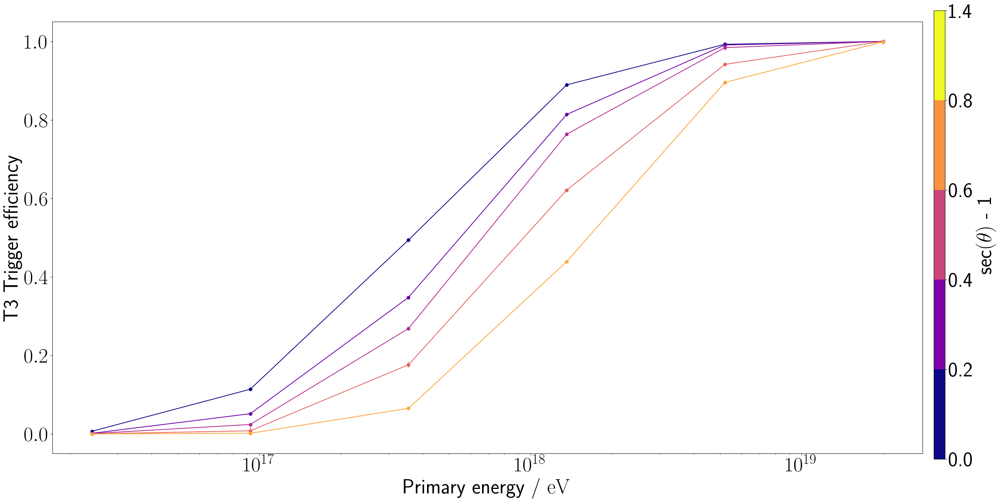

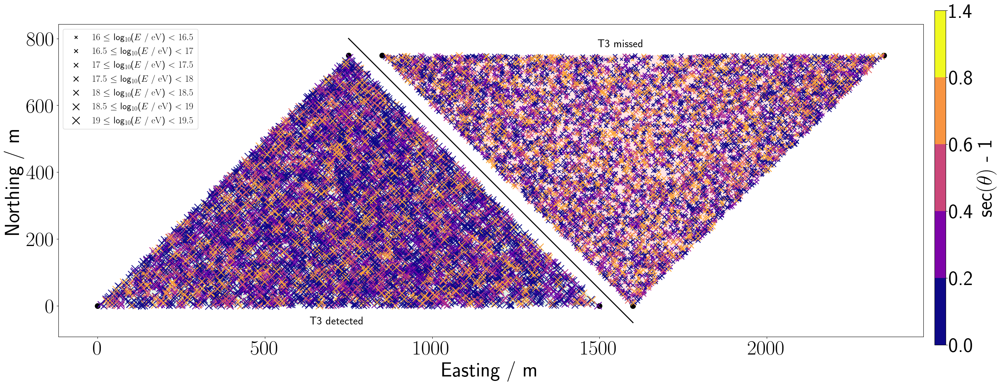

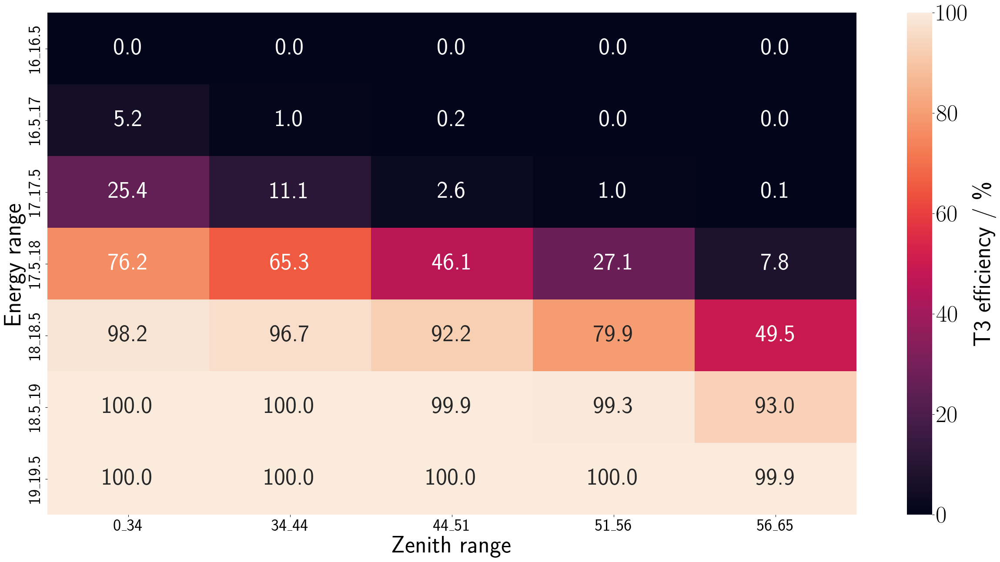

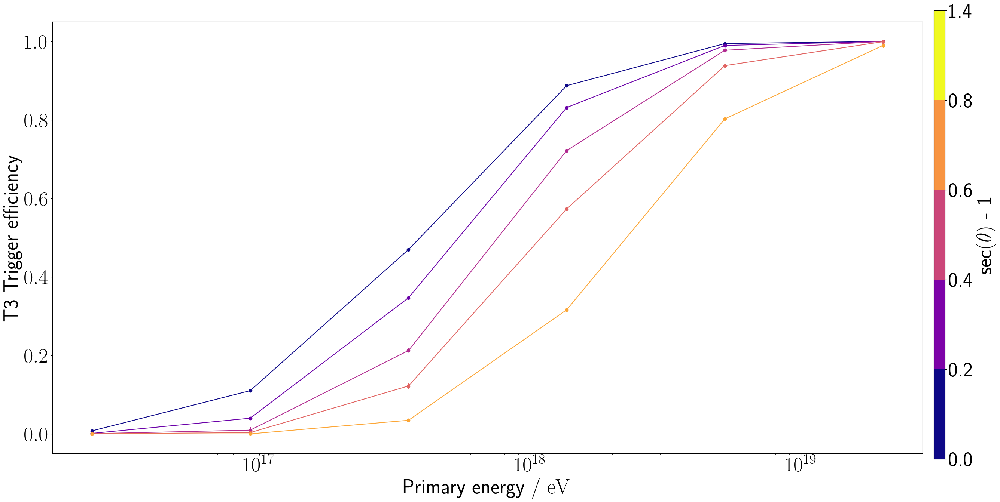

In [2]:
Hardware = HardwareClassifier()
Network = NNClassifier("ENSEMBLES/120_LSTM_3L_Downsampled_AllEnergies_5_0VEM/ensemble_03")
Mock = MockClassifier()

a, b = Mock.do_t3_simulation(1e6)
c, d = Network.do_t3_simulation("final_predictions", 1e6)
e, f = Hardware.do_t3_simulation("final_all_triggers", 1e6)

/tmp/ipykernel_2420701/681001236.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cmap.get_cmap("plasma")


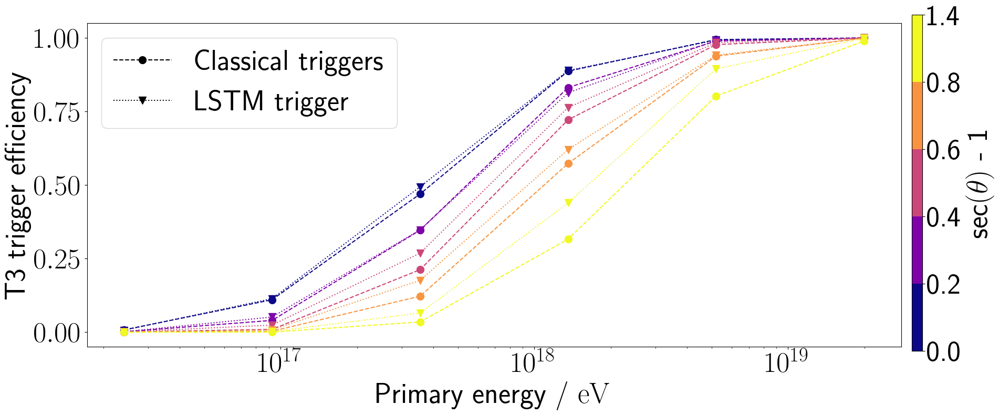

In [6]:
# fig, (ax1, ax2) = plt.subplots(2, 1)
fig = plt.figure(figsize = [20, 8])
colormap = cmap.get_cmap("plasma")

for t, (mock, hard, trig) in enumerate(zip(b, d, f)):
    c = colormap(t / 4)

    # plt.errorbar(a, mock, c = c, fmt = "-o", markersize = 10, mfc = "w")
    plt.errorbar(a, trig, c = c, fmt = "--o", markersize = 10)
    plt.errorbar(a, hard, c = c, fmt = ":v", markersize = 10)

# plt.errorbar([], [], c = "k", fmt = "-o", markersize = 10, mfc = "w", label = "Ideal trigger")
plt.errorbar([], [], c = "k", fmt = "--o", markersize = 10, label = "Classical triggers")
plt.errorbar([], [], c = "k", fmt = ":v", markersize = 10, label = "LSTM trigger")
plt.xlabel("Primary energy / $\mathrm{eV}$")
plt.ylabel("T3 trigger efficiency")
plt.xscale("log")
plt.legend()

norm = BoundaryNorm([0.00, 33.56, 44.42, 51.32, 56.25, 65.37], colormap.N)
ax2 = fig.add_axes([0.91, 0.1, 0.01, 0.8])

cbar = ColorbarBase(ax2, cmap=colormap, norm=norm, label = r"sec$(\theta)$ - 1")
cbar.set_ticks([0.00, 33.56, 44.42, 51.32, 56.25, 65.37])
cbar.set_ticklabels(["0.0", "0.2", "0.4", "0.6", "0.8", "1.4"])